In [ ]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
from scipy.stats import entropy
from sklearn import metrics
from sklearn.feature_selection import mutual_info_classif as MIC
from sklearn.feature_selection import chi2,f_classif
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix,roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


In [ ]:
df = pd.read_csv(r"codon_usage_dataset.csv")
df = df.drop(columns=['SpeciesID', 'SpeciesName'])
df

,Kingdom,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,1995,0.01654,0.01203,0.00050,0.00351,0.01203,0.03208,0.00100,0.04010,0.00551,0.02005,0.00752,0.02506,0.01103,0.04110,0.00902,0.03308,0.01003,0.05013,0.01554,0.01103,0.02356,0.03208,0.01203,0.00501,0.01003,0.01203,0.03158,0.01905,0.02456,0.01353,0.02155,0.00251,0.00652,0.00150,0.01554,0.00501,0.02105,0.00902,0.01053,0.00501,0.02256,0.00301,0.03108,0.00401,0.02607,0.00251,0.01153,0.00501,0.02356,0.01053,0.03860,0.00401,0.00702,0.00401,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,vrl,1474,0.02714,0.01357,0.00068,0.00678,0.00407,0.02849,0.00204,0.04410,0.01153,0.02510,0.00882,0.03324,0.00814,0.04071,0.00814,0.03256,0.01085,0.04885,0.01221,0.01357,0.00678,0.02714,0.01221,0.00407,0.01425,0.01221,0.01967,0.02239,0.01289,0.02103,0.01493,0.00407,0.00475,0.00068,0.02035,0.00950,0.02782,0.01425,0.00611,0.00475,0.02917,0.00407,0.02374,0.00882,0.02917,0.00271,0.01628,0.00204,0.01967,0.00543,0.03392,0.00136,0.00678,0.00136,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,vrl,4862,0.01974,0.02180,0.01357,0.01543,0.00782,0.01111,0.01028,0.01193,0.02283,0.01604,0.01316,0.02180,0.01625,0.01872,0.01213,0.01070,0.02406,0.01234,0.01440,0.00514,0.01604,0.01460,0.02098,0.01070,0.01728,0.01851,0.00864,0.01172,0.01892,0.01933,0.01419,0.01296,0.00967,0.01337,0.01337,0.01851,0.01131,0.01419,0.01090,0.02612,0.01275,0.01522,0.02365,0.02962,0.01789,0.01625,0.01234,0.01604,0.01687,0.02077,0.03949,0.00864,0.00596,0.00926,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144
3,vrl,1915,0.01775,0.02245,0.01619,0.00992,0.01567,0.01358,0.00940,0.01723,0.02402,0.02245,0.02507,0.02924,0.02089,0.02141,0.01723,0.01932,0.02141,0.00679,0.02245,0.00522,0.01358,0.00418,0.01410,0.00574,0.01201,0.00992,0.00366,0.02402,0.02663,0.02872,0.00992,0.02350,0.00522,0.01619,0.00836,0.02037,0.01358,0.02089,0.00731,0.02141,0.00888,0.01567,0.01253,0.02298,0.01358,0.00992,0.00888,0.00783,0.00679,0.03133,0.04282,0.00627,0.00261,0.00261,0.00366,0.01410,0.01671,0.03760,0.01932,0.03029,0.03446,0.00261,0.00157,0.00000
4,vrl,22831,0.02816,0.01371,0.00767,0.03679,0.01380,0.00548,0.00473,0.02076,0.02716,0.00867,0.01310,0.02773,0.02803,0.00508,0.00920,0.02965,0.02878,0.00574,0.01572,0.01577,0.01007,0.00508,0.00604,0.00679,0.01205,0.03127,0.00775,0.00959,0.00797,0.02006,0.00359,0.00933,0.01191,0.01616,0.00788,0.02593,0.00854,0.01200,0.02098,0.02089,0.01367,0.01502,0.01809,0.02738,0.01796,0.01082,0.00705,0.01174,0.00858,0.03408,0.03964,0.00950,0.00429,0.00578,0.00604,0.01494,0.01734,0.04148,0.02483,0.03359,0.03679,0.00000,0.00044,0.00131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8652,vrt,1190,0.01681,0.03025,0.00336,0.01176,0.01176,0.02689,0.00588,0.05882,0.01345,0.03445,0.01176,0.02941,0.00840,0.01849,0.00420,0.03697,0.01933,0.02017,0.01345,0.00504,0.01513,0.01261,0.01513,0.00588,0.00924,0.00756,0.01765,0.01765,0.00924,0.02437,0.01345,0.00840,0.00168,0.00924,0.02437,0.00840,0.02017,0.01513,0.00840,0.00504,0.02437,0.01008,0.03529,0.01176,0.02773,0.01597,0.02101,0.00756,0.02017,0.01849,0.02353,0.00672,0.00504,0.00420,0.00756,0.01261,0.01176,0.01345,0.03697,0.01597,0.03613,0.00084,0.00168,0.00168
8653,vrt,2665,0.02176,0.04353,0.00450,0.01163,0.00901,0.02627,0.00600,0.04053,0.01576,0.04353,0.00413,0.03114,0.01651,0.02176,0.00450,0.03677,0.01801,0.02289,0.01163,0.00938,0.00976,0.00863,0.01426,0.00713,0.01576,0.00938,0.02026,0.01951,0.00938,0.01426,0.01351,0.01088,0.00413,0.00863,0.01538,0.01088,0.01689,0.01201

In [ ]:
df.shape

(8657, 66)

Mean on whole data

In [ ]:
df.describe()

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
count,8.657000e+03,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.00000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000
mean,1.031792e+05,0.019945,0.020836,0.013814,0.015684,0.014446,0.015746,0.007800,0.021774,0.022131,0.021900,0.011921,0.023874,0.018629,0.017495,0.011084,0.020495,0.020637,0.023946,0.018130,0.015404,0.012754,0.011643,0.013861,0.011060,0.013486,0.019107,0.02164,0.017038,0.011065,0.013415,0.012132,0.012548,0.008885,0.010590,0.012565,0.015390,0.018108,0.015738,0.010418,0.016899,0.016760,0.018745,0.019717,0.023049,0.022515,0.008281,0.009021,0.011384,0.011675,0.028554,0.027684,0.009039,0.012154,0.005371,0.006725,0.011355,0.008121,0.028814,0.025561,0.030758,0.027695,0.001377,0.000598,0.001013
std,7.045305e+05,0.011201,0.009112,0.013628,0.007658,0.007225,0.010625,0.005028,0.017619,0.012348,0.010294,0.010386,0.006475,0.009468,0.010517,0.007107,0.010663,0.009903,0.018007,0.008824,0.014760,0.006989,0.008338,0.008310,0.009633,0.005633,0.009512,0.01625,0.009196,0.006576,0.007585,0.006914,0.007580,0.006321,0.006004,0.006516,0.008465,0.010291,0.009652,0.006868,0.009787,0.007329,0.012693,0.009831,0.014804,0.008923,0.006523,0.006870,0.005562,0.006103,0.019311,0.012208,0.005904,0.011882,0.003567,0.007331,0.008183,0.006202,0.011944,0.012523,0.014711,0.012830,0.001719,0.000811,0.001250
min,1.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000110,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.799000e+03,0.012010,0.014420,0.003270,0.010350,0.009450,0.008200,0.003880,0.009030,0.013640,0.014740,0.004110,0.019960,0.012110,0.010420,0.005600,0.012500,0.014110,0.011000,0.012570,0.005650,0.008240,0.005390,0.008170,0.004170,0.010300,0.012790,0.01000,0.010870,0.006370,0.008200,0.007200,0.007020,0.004090,0.006430,0.008410,0.009780,0.010540,0.008840,0.005330,0.009510,0.011800,0.010990,0.013150,0.012190,0.016560,0.003660,0.005140,0.007670,0.007300,0.014890,0.019130,0.005090,0.003850,0.002760,0.002020,0.004330,0.003140,0.020900,0.016790,0.020780,0.018640,0.000480,0.000000,0.000230
50%,3.583000e+03,0.019250,0.020440,0.010160,0.015160,0.013850,0.013660,0.007580,0.015940,0.021220,0.020340,0.010320,0.023780,0.018320,0.015270,0.010080,0.019080,0.019800,0.018760,0.017710,0.010060,0.012320,0.010450,0.013580,0.007890,0.013080,0.017510,0.01638,0.016180,0.010410,0.013430,0.011480,0.012310,0.007580,0.010470,0.011930,0.015340,0.016250,0.014970,0.009300,0.015890,0.015760,0.018010,0.018810,0.021280,0.021290,0.007190,0.007990,0.011110,0.010930,0.026530,0.026590,0.008090,0.007720,0.004820,0.004620,0.010860,0.006710,0.029340,0.023000,0.029160,0.026020,0.001060,0.0004

In [ ]:
df['Kingdom'], unique_labels = pd.factorize(df['Kingdom'])

Scaling data due different ranges among the features

In [ ]:
features = df.drop('Kingdom', axis=1)
target = df['Kingdom']

scaler = MinMaxScaler()
scaler.fit_transform(features)
features = pd.DataFrame(scaler.fit_transform(features),
                   columns=features.columns)
features.head()

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,0.000029,0.190993,0.162042,0.005529,0.056741,0.232779,0.333264,0.028425,0.373475,0.063670,0.244423,0.082956,0.244056,0.099271,0.337162,0.140302,0.372229,0.093025,0.408092,0.078835,0.075060,0.258333,0.315903,0.096899,0.075726,0.119661,0.107536,0.306305,0.098439,0.331399,0.193951,0.239978,0.023379,0.077591,0.009300,0.056421,0.052258,0.281192,0.092390,0.127621,0.065422,0.190059,0.012537,0.290549,0.029852,0.234211,0.023034,0.129886,0.079688,0.489711,0.072118,0.323745,0.063550,0.099265,0.114571,0.081203,0.131843,0.609105,0.054023,0.405130,0.083029,0.275055,0.055531,0.035211,0.000000
1,0.000014,0.313395,0.182786,0.007519,0.109602,0.078754,0.295969,0.057987,0.410729,0.133233,0.305986,0.097297,0.324751,0.073261,0.333962,0.126614,0.366378,0.100631,0.397672,0.061942,0.092344,0.074342,0.267258,0.098349,0.061518,0.170007,0.109145,0.190786,0.115699,0.173931,0.301462,0.166258,0.037910,0.056527,0.004216,0.073884,0.099093,0.371627,0.145959,0.074052,0.062027,0.245746,0.016952,0.221931,0.065659,0.262061,0.024869,0.183395,0.032448,0.408855,0.037189,0.284381,0.021553,0.095871,0.038857,0.024487,0.171608,0.615437,0.065765,0.399245,0.107668,0.278146,0.059956,0.047887,0.000000
2,0.000113,0.227945,0.293642,0.150044,0.249434,0.151316,0.115417,0.292211,0.111111,0.263809,0.195538,0.145174,0.211897,0.146251,0.153568,0.188676,0.120401,0.223150,0.100456,0.073052,0.034978,0.175877,0.143772,0.168989,0.161729,0.206156,0.165460,0.083802,0.060562,0.255296,0.277093,0.158018,0.120715,0.115078,0.082894,0.048542,0.193074,0.151082,0.145345,0.132105,0.341081,0.107414,0.063393,0.221090,0.220502,0.160722,0.149124,0.139011,0.255130,0.350655,0.142251,0.331231,0.136926,0.084276,0.264571,0.107310,0.199737,0.425980,0.168372,0.178848,0.154738,0.155661,0.086504,0.000000,0.043439
3,0.000027,0.204965,0.302398,0.179014,0.160362,0.303212,0.141076,0.267197,0.160473,0.277560,0.273680,0.276558,0.285292,0.188012,0.175636,0.268004,0.217396,0.198572,0.055275,0.113890,0.035522,0.148904,0.041162,0.113572,0.086759,0.143283,0.088674,0.035500,0.124122,0.359331,0.411697,0.110468,0.218890,0.062121,0.100378,0.030353,0.212475,0.181405,0.213971,0.088595,0.279577,0.074810,0.065267,0.117136,0.171071,0.122002,0.091034,0.100034,0.124543,0.141135,0.214574,0.359240,0.099366,0.036906,0.074571,0.065898,0.142669,0.285983,0.202521,0.169712,0.209055,0.217345,0.057743,0.110563,0.000000
4,0.000640,0.325173,0.184671,0.084808,0.594730,0.267028,0.056929,0.134451,0.193350,0.313843,0.105693,0.144512,0.270396,0.252273,0.041674,0.143102,0.333633,0.266926,0.046727,0.079748,0.107315,0.110417,0.050025,0.048651,0.102630,0.143760,0.279521,0.075170,0.049556,0.107543,0.287557,0.039978,0.086904,0.141735,0.100192,0.028610,0.270470,0.114080,0.122913,0.254272,0.272787,0.115164,0.062560,0.169113,0.203826,0.161351,0.099293,0.079419,0.186735,0.178341,0.233409,0.332492,0.150555,0.060662,0.165143,0.108750,0.151169,0.296765,0.223419,0.218113,0.231831,0.232040,0.000000,0.030986,0.039517


In [ ]:
unique_labels

Index(['vrl', 'bct', 'pln', 'inv', 'vrt'], dtype='object')

In [ ]:
target.head()

0    0
1    0
2    0
3    0
4    0
Name: Kingdom, dtype: int64

Stats after min-max scaling

In [ ]:
overallstats = features.describe()
overallstats

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
count,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000,8657.000000
mean,0.002994,0.230311,0.280659,0.152742,0.253538,0.279526,0.163574,0.221718,0.202795,0.255737,0.266977,0.131502,0.232352,0.167660,0.143521,0.172413,0.230622,0.191402,0.194939,0.091973,0.104822,0.139850,0.114650,0.111645,0.167169,0.160890,0.170800,0.209895,0.088042,0.149309,0.192309,0.135096,0.116876,0.105741,0.065657,0.045620,0.160533,0.241896,0.161196,0.126260,0.220677,0.141197,0.078075,0.184326,0.171583,0.202270,0.075991,0.101617,0.181069,0.242682,0.195563,0.231926,0.143257,0.171859,0.153462,0.121088,0.114897,0.138991,0.155200,0.224537,0.212284,0.174674,0.030456,0.042118,0.030573
std,0.020642,0.129347,0.122738,0.150686,0.123788,0.139810,0.110374,0.142908,0.164101,0.142687,0.125491,0.114578,0.063878,0.085216,0.086274,0.110545,0.119988,0.091851,0.146592,0.044762,0.100440,0.076634,0.082109,0.066937,0.145608,0.067204,0.085027,0.157615,0.047520,0.088733,0.108725,0.076995,0.070605,0.075225,0.037224,0.023658,0.088296,0.137468,0.098859,0.083233,0.127795,0.061743,0.052866,0.091906,0.110208,0.080166,0.059857,0.077390,0.088476,0.126846,0.132258,0.102680,0.093567,0.168010,0.101923,0.131988,0.082796,0.106147,0.064333,0.110001,0.101535,0.080921,0.038042,0.057126,0.037713
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000023,0.138684,0.194235,0.036157,0.167313,0.182856,0.085186,0.110290,0.084102,0.157615,0.179690,0.045339,0.193746,0.108991,0.085480,0.087105,0.140655,0.130866,0.089547,0.063768,0.038448,0.090351,0.053077,0.065807,0.063029,0.122882,0.114329,0.096993,0.056170,0.085953,0.117546,0.080178,0.065387,0.048673,0.039866,0.030534,0.102013,0.140796,0.090546,0.064598,0.124184,0.099410,0.045775,0.122932,0.090747,0.148774,0.033587,0.057902,0.121998,0.151736,0.101979,0.159980,0.080666,0.054440,0.078857,0.036370,0.043813,0.053740,0.112571,0.147488,0.143419,0.117565,0.010619,0.000000,0.006938
50%,0.000076,0.222286,0.275323,0.112340,0.245070,0.267995,0.141907,0.215463,0.148459,0.245205,0.247958,0.113844,0.231429,0.164882,0.125267,0.156790,0.214696,0.183639,0.152719,0.089844,0.068459,0.135088,0.102905,0.109384,0.119256,0.156049,0.156521,0.158875,0.083609,0.140467,0.192517,0.127840,0.114661,0.090206,0.064914,0.043314,0.160008,0.217072,0.153334,0.112714,0.207495,0.132772,0.075014,0.175844,0.158416,0.191268,0.065981,0.090008,0.176714,0.227188,0.181700,0.222727,0.128209,0.109163,0.137714,0.083183,0.109886,0.114838,0.158031,0.202038,0.201256,0.164112,0.023451,0.031690,0.022926
75%

Mean for each feature by class

In [ ]:
features['Kingdom'] = target
meanbyclass = features.groupby('Kingdom').mean()
meanbyclass

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
Kingdom,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000703,0.274543,0.248523,0.178108,0.274373,0.286357,0.135311,0.309189,0.137439,0.259109,0.200833,0.189562,0.234231,0.181291,0.115403,0.206100,0.214094,0.185837,0.133293,0.095974,0.064115,0.170311,0.123071,0.144869,0.116147,0.169048,0.151201,0.125576,0.091169,0.161483,0.229846,0.133506,0.152331,0.087410,0.078781,0.038877,0.200003,0.206773,0.216975,0.113015,0.269018,0.138407,0.089794,0.168637,0.206839,0.195641,0.109166,0.105946,0.210606,0.241412,0.206110,0.218559,0.126064,0.107545,0.174837,0.092949,0.165988,0.204561,0.160466,0.197536,0.201792,0.154045,0.027537,0.039374,0.022166
1,0.005817,0.219841,0.260721,0.185974,0.214974,0.239291,0.165282,0.168347,0.278387,0.272245,0.308033,0.106237,0.219729,0.152319,0.160947,0.183426,0.248484,0.166236,0.257863,0.092640,0.174026,0.097113,0.100113,0.070109,0.254055,0.156564,0.179658,0.299815,0.069149,0.150491,0.136952,0.108946,0.086851,0.125054,0.056194,0.046864,0.118512,0.272359,0.124820,0.157660,0.219055,0.121087,0.071619,0.185191,0.163091,0.178744,0.036189,0.062288,0.159695,0.228410,0.214848,0.183882,0.172848,0.275410,0.128297,0.184119,0.068067,0.061040,0.156824,0.246037,0.241849,0.167320,0.030745,0.037790,0.041935
2,0.002841,0.198392,0.330814,0.090089,0.292921,0.362280,0.211233,0.202933,0.149803,0.244285,0.286995,0.097582,0.234258,0.187587,0.161686,0.115226,0.214056,0.238879,0.195036,0.088056,0.084979,0.165483,0.121024,0.119787,0.140357,0.166358,0.197113,0.217906,0.097674,0.156551,0.231100,0.164832,0.111883,0.117460,0.059905,0.048327,0.171447,0.249106,0.127576,0.109991,0.169610,0.155706,0.078632,0.191678,0.139107,0.229166,0.066795,0.114246,0.179032,0.250985,0.136361,0.298444,0.123240,0.133269,0.156627,0.088347,0.104258,0.158805,0.151790,0.225097,0.172805,0.206390,0.023317,0.045680,0.028134
3,0.002095,0.194754,0.327626,0.117260,0.274074,0.270691,0.149636,0.187631,0.179655,0.245832,0.274636,0.112359,0.240574,0.165207,0.141419,0.164377,0.211305,0.210945,0.182054,0.088206,0.070359,0.130842,0.108077,0.129182,0.127411,0.143029,0.184133,0.184000,0.114363,0.089901,0.183614,0.143007,0.118278,0.106411,0.065407,0.045965,0.157663,0.222195,0.158970,0.116378,0.188234,0.168997,0.078117,0.180955,0.171657,0.233234,0.090563,0.132878,0.179711,0.259162,0.213246,0.295256,0.159536,0.134202,0.179163,0.073159,0.123622,0.123973,0.159755,0.230346,0.237732,0.180810,0.048104,0.049972,0.023557
4,0.001504,0.201693,0.344119,0.065204,0.198777,0.236725,0.196550,0.152945,0.346255,0.188652,0.331505,0.085464,0.277655,0.120409,0.150081,0.101317,0.311934,0.188909,0.200771,0.083723,0.051728,0.156433,0.146803,0.108480,0.099249,0.155850,0.121826,0.184221,0.103831,0.161888,0.201241,0.195867,0.102925,0.056377,0.064457,0.069367,0.153770,0.280168,0.164325,0.082710,0.168025,0.181771,0.045246,0.257172,0.116320,0.240810,0.125028,0.218891,0.144606,0.280141,0.169155,0.271346,0.095475,0.114753,0.119792,0.099234,0.115156,0.193780,0.115006,0.240734,0.169456,0.230467,0.034823,0.058766,0.032386


In [ ]:
combinedstats = overallstats.append(meanbyclass).T
combinedstats

,count,mean,std,min,25%,50%,75%,max,0,1,2,3,4
Ncodons,8657.0,0.002994,0.020642,0.0,0.000023,0.000076,0.000351,1.0,0.000703,0.005817,0.002841,0.002095,0.001504
UUU,8657.0,0.230311,0.129347,0.0,0.138684,0.222286,0.312125,1.0,0.274543,0.219841,0.198392,0.194754,0.201693
UUC,8657.0,0.280659,0.122738,0.0,0.194235,0.275323,0.355199,1.0,0.248523,0.260721,0.330814,0.327626,0.344119
UUA,8657.0,0.152742,0.150686,0.0,0.036157,0.112340,0.213401,1.0,0.178108,0.185974,0.090089,0.117260,0.065204
UUG,8657.0,0.253538,0.123788,0.0,0.167313,0.245070,0.326544,1.0,0.274373,0.214974,0.292921,0.274074,0.198777
...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAA,8657.0,0.212284,0.101535,0.0,0.143419,0.201256,0.268618,1.0,0.201792,0.241849,0.172805,0.237732,0.169456
GAG,8657.0,0.174674,0.080921,0.0,0.117565,0.164112,0.220372,1.0,0.154045,0.167320,0.206390,0.180810,0.230467
UAA,8657.0,0.030456,0.038042,0.0,0.010619,0.023451,0.042257,1.0,0.027537,0.030745,0.023317,0.048104,0.034823
UAG,8657.0,0.042118,0.057126,0.0,0.000000,0.031690,0.057746,1.0,0.039374,0.037790,0.045680,0.049972,0.058766


Extracting dataframes according class labels for visualization

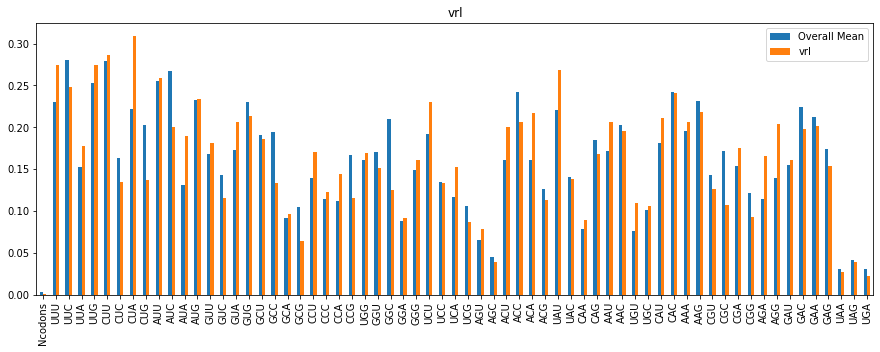

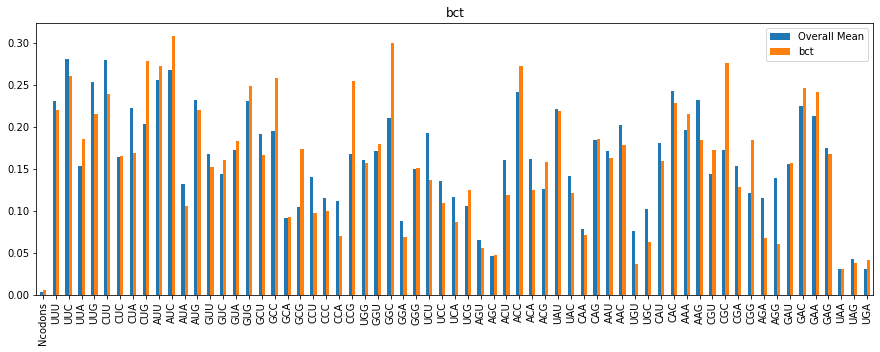

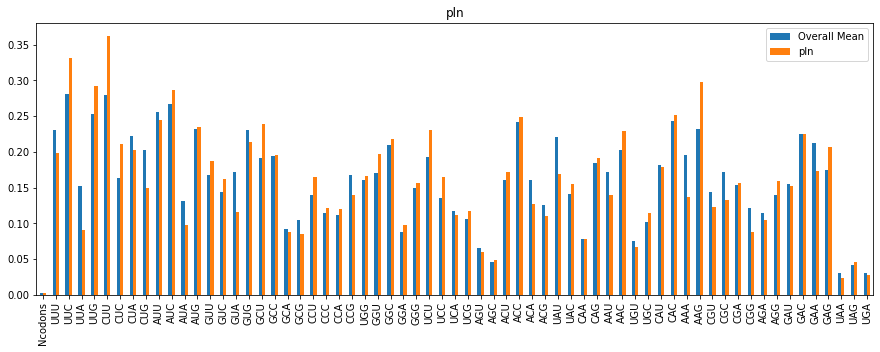

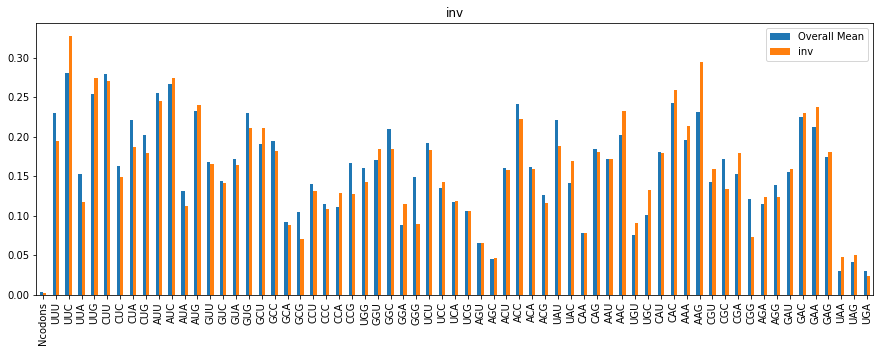

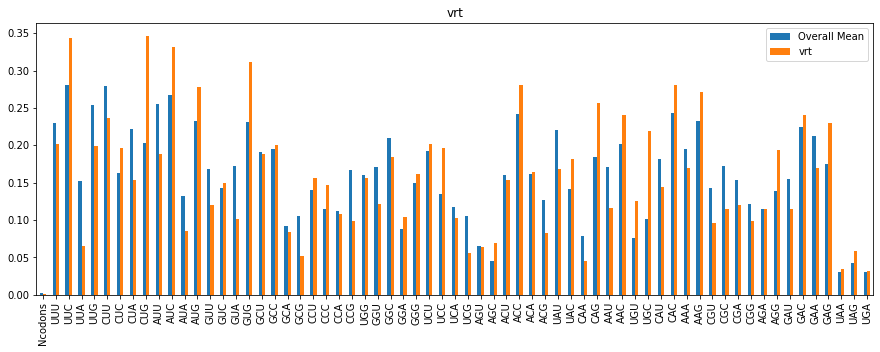

In [ ]:
for col, label in zip([0,1,2,3,4], unique_labels):
    combinedstats[['mean',col]].plot(kind='bar', title = label, figsize=(15,5))
    plt.legend(["Overall Mean", label]);
    plt.show()
#     break

In [ ]:
covariance_matrix = pd.DataFrame.cov(features.drop('Kingdom', axis=1))
covariance_matrix

,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
Ncodons,4.260832e-04,-0.000032,-0.000029,0.000019,-0.000012,-0.000051,0.000055,-0.000089,0.000253,-0.000004,0.000104,-0.000049,-0.000009,-0.000076,0.000033,-0.000049,0.000125,-0.000098,0.000164,-0.000017,0.000216,-0.000096,-0.000017,-0.000081,0.000231,-0.000027,-0.000057,0.000203,-0.000040,0.000027,-0.000110,-0.000036,-0.000069,0.000083,-0.000020,0.000015,-0.000134,0.000032,-0.000116,0.000080,-0.000059,-0.000074,-0.000024,0.000042,-0.000049,-0.000095,-0.000074,-0.000063,-0.000013,-0.000045,-0.000028,-0.000102,0.000027,0.000299,-0.000018,0.000163,-0.000080,-0.000120,-9.086539e-06,3.668202e-07,0.000036,0.000011,-0.000012,5.717392e-07,0.000018
UUU,-3.156253e-05,0.016731,-0.009151,0.013894,0.006003,0.007767,-0.009005,0.007919,-0.012651,0.014020,-0.010295,0.008498,0.000191,0.006596,-0.007569,0.007848,-0.007503,0.003556,-0.012737,0.001797,-0.007023,0.003555,-0.005456,0.002408,-0.011032,-0.001514,0.002495,-0.012928,0.001440,-0.003086,0.007629,-0.004688,0.004587,-0.004956,0.002862,-0.001197,0.005886,-0.011213,0.006523,-0.004625,0.012089,-0.003124,0.002867,-0.006311,0.010324,-0.003260,0.002942,-0.002192,0.004557,-0.009377,0.011565,-0.004055,-0.000182,-0.012903,0.000006,-0.008730,0.004649,0.000174,5.121909e-03,-9.650864e-03,0.006348,-0.005787,0.000873,-1.479220e-04,-0.000609
UUC,-2.872894e-05,-0.009151,0.015065,-0.011509,-0.003683,-0.003440,0.008303,-0.006799,0.008140,-0.009754,0.010065,-0.006826,0.000866,-0.004107,0.006467,-0.007466,0.005003,-0.002076,0.008606,-0.002277,0.003742,-0.002397,0.004197,-0.002320,0.006528,0.001569,-0.002005,0.008705,-0.001318,0.000559,-0.004459,0.004597,-0.003399,0.003688,-0.002425,0.000740,-0.004218,0.008112,-0.005713,0.002875,-0.008729,0.003953,-0.002816,0.003484,-0.007679,0.004200,-0.002077,0.002243,-0.003491,0.007885,-0.009526,0.004185,-0.000658,0.007982,-0.000566,0.004257,-0.003862,0.000169,-4.145849e-03,7.066138e-03,-0.006051,0.003982,-0.000458,1.276369e-04,0.000298
UUA,1.938712e-05,0.013894,-0.011509,0.022706,0.003159,0.004168,-0.010708,0.009334,-0.014639,0.016747,-0.010979,0.011058,-0.000477,0.006384,-0.008451,0.011323,-0.010357,0.003200,-0.013654,0.002262,-0.006513,0.002195,-0.006694,0.002371,-0.010817,-0.002791,0.003398,-0.013879,0.001331,-0.004205,0.006707,-0.006262,0.005470,-0.005137,0.003233,-0.001582,0.006196,-0.012690,0.007616,-0.004669,0.014010,-0.004607,0.003896,-0.008089,0.012773,-0.004407,0.002142,-0.004134,0.004803,-0.010686,0.015773,-0.005965,0.000921,-0.013175,-0.000385,-0.008661,0.005514,-0.002131,6.214340e-03,-1.047573e-02,0.009710,-0.007184,0.001376,1.888224e-04,-0.000302
UUG,-1.202435e-05,0.006003,-0.003683,0.003159,0.015324,0.005623,-0.004770,0.004469,-0.006921,0.006104,-0.004494,0.002208,0.001081,0.004225,-0.003674,0.002118,-0.001775,0.003091,-0.007156,0.001072,-0.003847,0.001832,-0.003306,0.001612,-0.006370,-0.000420,0.002396,-0.008109,0.000702,-0.000987,0.003966,-0.002095,0.002121,-0.001907,0.001387,-0.000609,0.002817,-0.005986,0.002242,-0.002318,0.003763,-0.001562,0.001517,-0.003355,0.003169,-0.001741,0.001702,-0.001069,0.002995,-0.004797,0.003777,-0.000347,0.001273,-0.007739,0.002072,-0.004919,0.002336,0.001442,2.944404e-03,-5.496483e-03,0.003430,-0.002327,0.000068,-2.355258e-05,-0.000730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAA,3.642776e-05,0.006348,-0.006051,0.009710,0.003430,0.004120,-0.006394,0.004417,-0.007805,0.009047,-0.004969,0.005063,0.000490,0.003711,-0.005023,0.006397,-0.006232,0.002002,-0.008173,0.001618,-0.003876,0.000650,-0.004852,0.001323,-0.006167,-0.001946,0.002115,-0.008187,0.

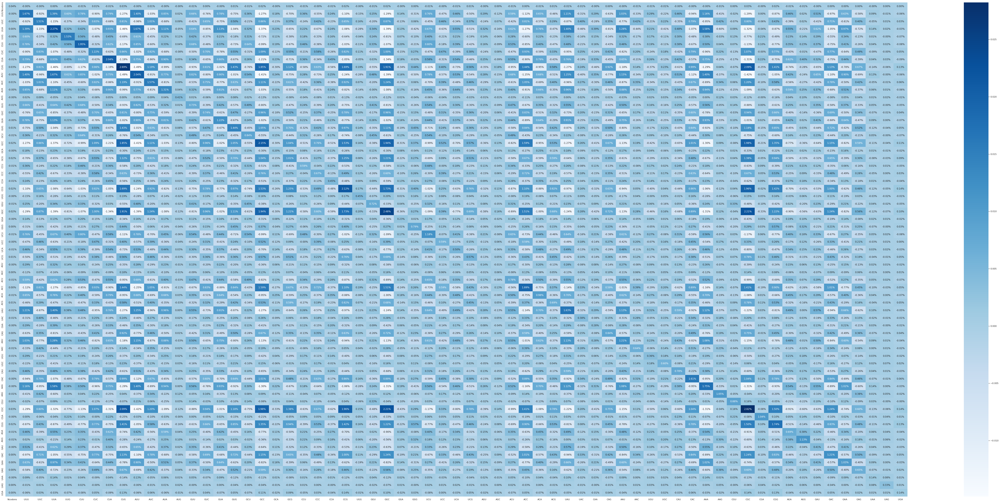

In [ ]:
sb.set(rc = {'figure.figsize':(100,45)})
sb.heatmap(covariance_matrix, annot=True, fmt='.2%', cmap='Blues')
plt.show()

Empty DataFrame
Columns: [Ncodons, UUU, UUC, UUA, UUG, CUU, CUC, CUA, CUG, AUU, AUC, AUA, AUG, GUU, GUC, GUA, GUG, GCU, GCC, GCA, GCG, CCU, CCC, CCA, CCG, UGG, GGU, GGC, GGA, GGG, UCU, UCC, UCA, UCG, AGU, AGC, ACU, ACC, ACA, ACG, UAU, UAC, CAA, CAG, AAU, AAC, UGU, UGC, CAU, CAC, AAA, AAG, CGU, CGC, CGA, CGG, AGA, AGG, GAU, GAC, GAA, GAG, UAA, UAG, UGA, Kingdom]
Index: []


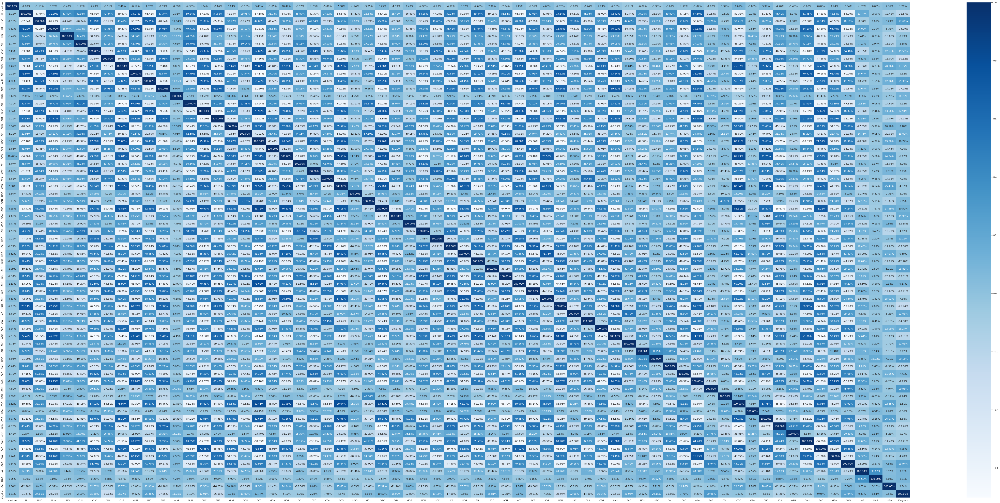

In [ ]:
# https://pythontic.com/pandas/dataframe-computations/correlation
corrrelation = features.corr(method="pearson");

print(corrrelation[(corrrelation==0).any(axis=1)])

sb.set(rc = {'figure.figsize':(100,45)})
sb.heatmap(corrrelation, annot=True, fmt='.2%', cmap='Blues')
plt.show()

In [ ]:
corrrelation = features.corr(method="kendall")
print(corrrelation[(corrrelation==0).any(axis=1)])

Empty DataFrame
Columns: [Ncodons, UUU, UUC, UUA, UUG, CUU, CUC, CUA, CUG, AUU, AUC, AUA, AUG, GUU, GUC, GUA, GUG, GCU, GCC, GCA, GCG, CCU, CCC, CCA, CCG, UGG, GGU, GGC, GGA, GGG, UCU, UCC, UCA, UCG, AGU, AGC, ACU, ACC, ACA, ACG, UAU, UAC, CAA, CAG, AAU, AAC, UGU, UGC, CAU, CAC, AAA, AAG, CGU, CGC, CGA, CGG, AGA, AGG, GAU, GAC, GAA, GAG, UAA, UAG, UGA, Kingdom]
Index: []


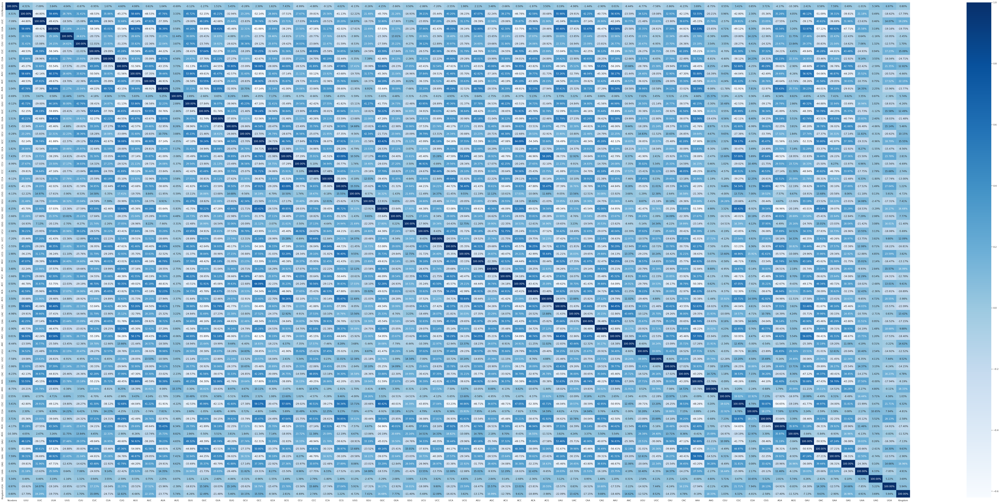

In [ ]:

sb.set(rc = {'figure.figsize':(100,45)})
sb.heatmap(corrrelation, annot=True, fmt='.2%', cmap='Blues')
plt.show()

Empty DataFrame
Columns: [Ncodons, UUU, UUC, UUA, UUG, CUU, CUC, CUA, CUG, AUU, AUC, AUA, AUG, GUU, GUC, GUA, GUG, GCU, GCC, GCA, GCG, CCU, CCC, CCA, CCG, UGG, GGU, GGC, GGA, GGG, UCU, UCC, UCA, UCG, AGU, AGC, ACU, ACC, ACA, ACG, UAU, UAC, CAA, CAG, AAU, AAC, UGU, UGC, CAU, CAC, AAA, AAG, CGU, CGC, CGA, CGG, AGA, AGG, GAU, GAC, GAA, GAG, UAA, UAG, UGA, Kingdom]
Index: []


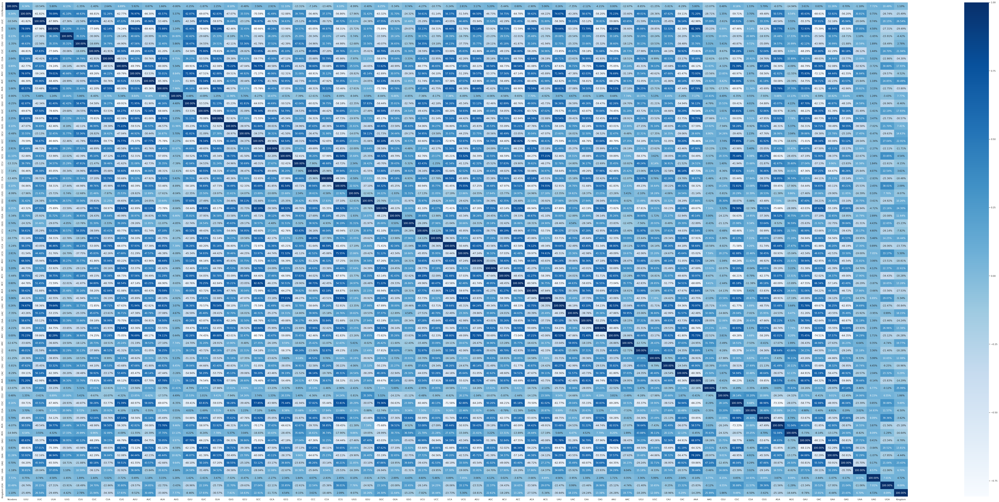

In [ ]:
corrrelation = features.corr(method="spearman")

print(corrrelation[(corrrelation==0).any(axis=1)])

sb.set(rc = {'figure.figsize':(100,45)})
sb.heatmap(corrrelation, annot=True, fmt='.2%', cmap='Blues')
plt.show()

Entropy for all features

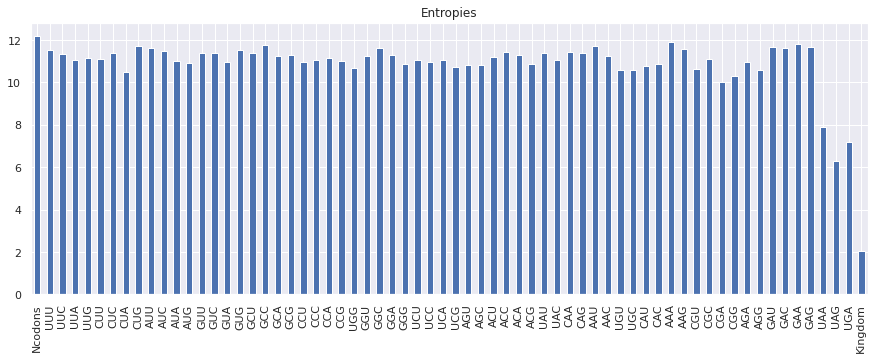

In [ ]:
def p_entropy(column, base=None):
    vc = pd.Series(column).value_counts(normalize=True, sort=False)
    return entropy(vc.values, base=2)

entropy_df = features.loc[:,:].apply(p_entropy,axis=0)
entropy_df.plot(kind='bar', title = 'Entropies', figsize=(15,5))

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html
#  Mutual Information between features and target
mi_score = MIC(features, target)
print(mi_score)

[0.11632769 0.14762808 0.10034806 0.24672795 0.07702199 0.10935996
 0.13294047 0.15503664 0.245283   0.16231456 0.12872093 0.19582254
 0.04779176 0.09681528 0.11405641 0.14801587 0.08083096 0.11955041
 0.16456976 0.06085694 0.17961994 0.16155204 0.09152939 0.19025574
 0.15061329 0.05574352 0.07291146 0.17465173 0.12017416 0.06975978
 0.15645016 0.08396867 0.14754711 0.08815134 0.10088679 0.06630121
 0.15966311 0.09559408 0.16745709 0.07764973 0.11889885 0.06323163
 0.15917516 0.10287969 0.13080005 0.07149854 0.2712898  0.18205956
 0.06946325 0.05465824 0.1984178  0.15431797 0.08585821 0.16443509
 0.07728045 0.14622866 0.21073333 0.26427682 0.063484   0.09304024
 0.12009023 0.09520034 0.08824683 0.04117432 0.06243224 1.43371013]


Each record represents MI score w.r.t target variable Kingdom

In [ ]:
# Chi square test score between features and target
chi_score = chi2(features, target)
print(type(chi_score))

<class 'tuple'>


In [ ]:
# ANOVA fscore between features and target
fc_score = f_classif(features, target)
print(fc_score)

(array([  23.66875986,  142.5795915 ,  215.54433284,  188.27177571,
        170.84448974,  229.12175555,  140.05869285,  510.81517287,
        490.39375489,   40.07106523,  369.71749548,  315.83464756,
         95.59751735,  103.05774257,  129.92494023,  249.81788434,
        100.5092949 ,  183.92558497,  297.28863729,   14.39240084,
        713.67475656,  475.28568208,   53.10952036,  611.39699215,
        493.33585655,   33.39951713,  133.87971251,  568.18020414,
        241.69594253,  128.82584832,  381.05465581,  239.72730522,
        371.05221306,  160.29154585,  154.55850057,  197.92840626,
        366.22255203,  101.27136947,  443.66387759,  185.89539581,
        216.30329529,  216.20438055,   94.32864902,  100.74888735,
        148.46363784,  186.41531471,  909.06300458,  657.86623866,
        151.20783261,   25.21971354,  110.34853604,  546.10130635,
        162.81819038,  529.85599744,  108.39155905,  289.54411316,
        669.74836037, 1060.92486621,   54.00271662,   76.2310

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


In [ ]:
test_stats = pd.DataFrame({
    'Features':features.columns,
    'MI Score':mi_score,
    'Chi-test Univariate Scores':chi_score[0],
    'Chi-test P-values':chi_score[1],
    'F-Stats':fc_score[0],
    'F-test P-values':fc_score[1]
}) 
test_stats

,Features,MI Score,Chi-test Univariate Scores,Chi-test P-values,F-Stats,F-test P-values
0,Ncodons,0.116328,13.335039,9.749626e-03,23.668760,1.709620e-19
1,UUU,0.147628,38.885698,7.355621e-08,142.579592,3.138279e-118
2,UUC,0.100348,42.103925,1.587435e-08,215.544333,1.337987e-176
3,UUA,0.246728,103.035382,2.220530e-21,188.271776,5.486286e-155
4,UUG,0.077022,38.296765,9.732026e-08,170.844490,4.757578e-141
...,...,...,...,...,...,...
61,GAG,0.095200,25.038519,4.942055e-05,180.851178,4.591535e-149
62,UAA,0.088247,13.067954,1.094849e-02,70.977318,3.027373e-59
63,UAG,0.041174,6.665948,1.546300e-01,21.713848,7.534320e-18
64,UGA,0.062432,20.692852,3.643036e-04,117.173096,1.716415e-97


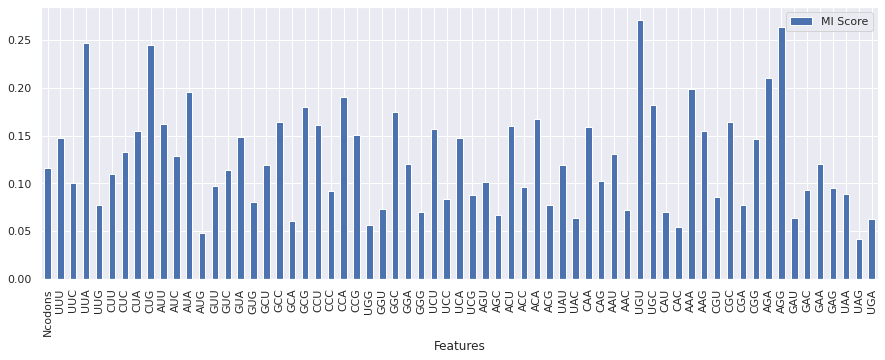

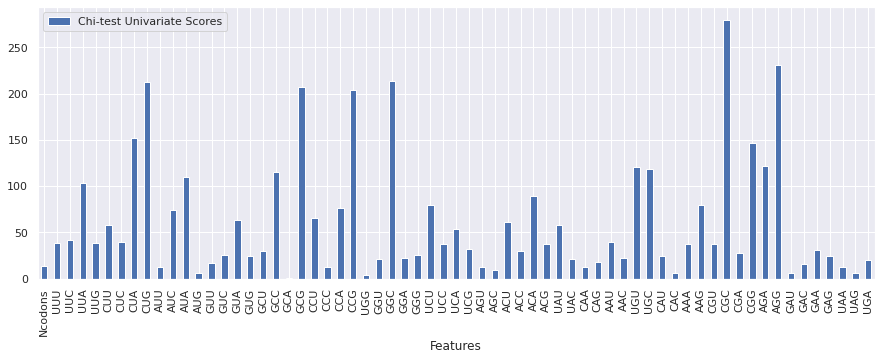

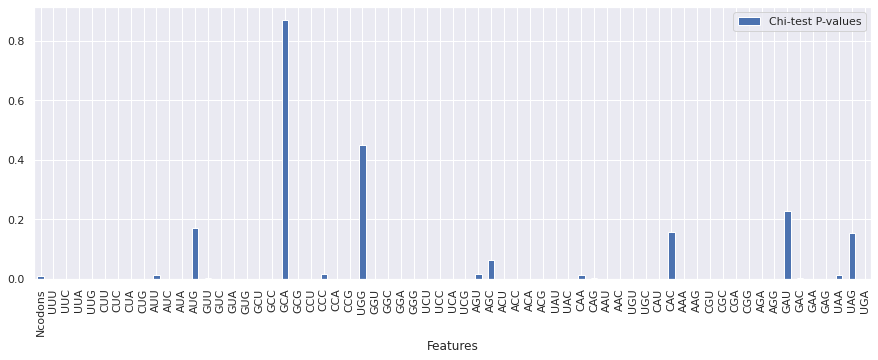

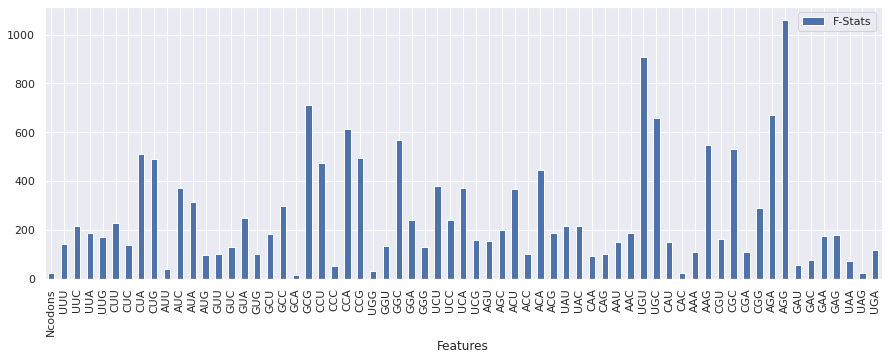

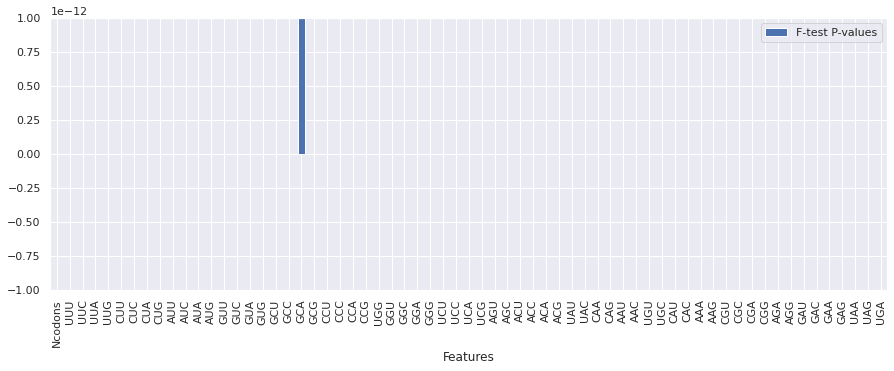

In [ ]:
if 65 in test_stats.index:
    test_stats = test_stats.drop(index=65)
    

for c in test_stats.columns:
    if c=='Features':
        continue
    test_stats.plot(kind='bar', x='Features',y=c, figsize=(15,5))
    plt.show()


In [ ]:
pip install git+https://github.com/hyperopt/hyperopt-sklearn


  Cloning https://github.com/hyperopt/hyperopt-sklearn to /tmp/pip-req-build-tf3nxq8s
  Running command git clone -q https://github.com/hyperopt/hyperopt-sklearn /tmp/pip-req-build-tf3nxq8s
     |████████████████████████████████| 154 kB 2.0 MB/s 
  Created wheel for hpsklearn: filename=hpsklearn-0.0.3-py3-none-any.whl size=27011 sha256=e197279c604e084c160ad9243427f5f9887ee247dbb210689ed9bcb6dd0e35f3
  Stored in directory: /tmp/pip-ephem-wheel-cache-v1rcoevu/wheels/4b/06/53/c35e360ca94aa0ab93518bf53abe5fb270c95dbe56b8e2e76b
Successfully built hpsklearn


In [ ]:
features.drop('Kingdom',1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,AUU,AUC,AUA,AUG,GUU,GUC,GUA,GUG,GCU,GCC,GCA,GCG,CCU,CCC,CCA,CCG,UGG,GGU,GGC,GGA,GGG,UCU,UCC,UCA,UCG,AGU,AGC,ACU,ACC,ACA,ACG,UAU,UAC,CAA,CAG,AAU,AAC,UGU,UGC,CAU,CAC,AAA,AAG,CGU,CGC,CGA,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,0.000029,0.190993,0.162042,0.005529,0.056741,0.232779,0.333264,0.028425,0.373475,0.063670,0.244423,0.082956,0.244056,0.099271,0.337162,0.140302,0.372229,0.093025,0.408092,0.078835,0.075060,0.258333,0.315903,0.096899,0.075726,0.119661,0.107536,0.306305,0.098439,0.331399,0.193951,0.239978,0.023379,0.077591,0.009300,0.056421,0.052258,0.281192,0.092390,0.127621,0.065422,0.190059,0.012537,0.290549,0.029852,0.234211,0.023034,0.129886,0.079688,0.489711,0.072118,0.323745,0.063550,0.099265,0.114571,0.081203,0.131843,0.609105,0.054023,0.405130,0.083029,0.275055,0.055531,0.035211,0.000000
1,0.000014,0.313395,0.182786,0.007519,0.109602,0.078754,0.295969,0.057987,0.410729,0.133233,0.305986,0.097297,0.324751,0.073261,0.333962,0.126614,0.366378,0.100631,0.397672,0.061942,0.092344,0.074342,0.267258,0.098349,0.061518,0.170007,0.109145,0.190786,0.115699,0.173931,0.301462,0.166258,0.037910,0.056527,0.004216,0.073884,0.099093,0.371627,0.145959,0.074052,0.062027,0.245746,0.016952,0.221931,0.065659,0.262061,0.024869,0.183395,0.032448,0.408855,0.037189,0.284381,0.021553,0.095871,0.038857,0.024487,0.171608,0.615437,0.065765,0.399245,0.107668,0.278146,0.059956,0.047887,0.000000
2,0.000113,0.227945,0.293642,0.150044,0.249434,0.151316,0.115417,0.292211,0.111111,0.263809,0.195538,0.145174,0.211897,0.146251,0.153568,0.188676,0.120401,0.223150,0.100456,0.073052,0.034978,0.175877,0.143772,0.168989,0.161729,0.206156,0.165460,0.083802,0.060562,0.255296,0.277093,0.158018,0.120715,0.115078,0.082894,0.048542,0.193074,0.151082,0.145345,0.132105,0.341081,0.107414,0.063393,0.221090,0.220502,0.160722,0.149124,0.139011,0.255130,0.350655,0.142251,0.331231,0.136926,0.084276,0.264571,0.107310,0.199737,0.425980,0.168372,0.178848,0.154738,0.155661,0.086504,0.000000,0.043439
3,0.000027,0.204965,0.302398,0.179014,0.160362,0.303212,0.141076,0.267197,0.160473,0.277560,0.273680,0.276558,0.285292,0.188012,0.175636,0.268004,0.217396,0.198572,0.055275,0.113890,0.035522,0.148904,0.041162,0.113572,0.086759,0.143283,0.088674,0.035500,0.124122,0.359331,0.411697,0.110468,0.218890,0.062121,0.100378,0.030353,0.212475,0.181405,0.213971,0.088595,0.279577,0.074810,0.065267,0.117136,0.171071,0.122002,0.091034,0.100034,0.124543,0.141135,0.214574,0.359240,0.099366,0.036906,0.074571,0.065898,0.142669,0.285983,0.202521,0.169712,0.209055,0.217345,0.057743,0.110563,0.000000
4,0.000640,0.325173,0.184671,0.084808,0.594730,0.267028,0.056929,0.134451,0.193350,0.313843,0.105693,0.144512,0.270396,0.252273,0.041674,0.143102,0.333633,0.266926,0.046727,0.079748,0.107315,0.110417,0.050025,0.048651,0.102630,0.143760,0.279521,0.075170,0.049556,0.107543,0.287557,0.039978,0.086904,0.141735,0.100192,0.028610,0.270470,0.114080,0.122913,0.254272,0.272787,0.115164,0.062560,0.169113,0.203826,0.161351,0.099293,0.079419,0.186735,0.178341,0.233409,0.332492,0.150555,0.060662,0.165143,0.108750,0.151169,0.296765,0.223419,0.218113,0.231831,0.232040,0.000000,0.030986,0.039517
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8652,0.000006,0.194111,0.407462,0.037152,0.190107,0.227554,0.279348,0.167140,0.547825,0.155419,0.419968,0.129730,0.286969,0.075601,0.151682,0.065329,0.416001,0.179280,0.164197,0.068233,0.034297,0.165899,0.124175,0.121869,0.088875,0.110236,0.067578,0.171193,0.091205,0.124680,0.349341,0.149777,0.078241,0.019993,0.057288,0.088480,0.087619,0.269436,0.154973,0.101806,0.065814,0.205307,0.041984,0.329906,0.087546,0.249124,0.146554,0.236679,0.120248,0.419248,0.126635,0.196989,0.106498,0.071267,0.120000,0.136118,0.127593,0.201266,0.072444,

In [ ]:
# from hpsklearn import HyperoptEstimator, any_classifier, any_preprocessing
# from hyperopt import tpe

# estim = HyperoptEstimator(classifier=any_classifier('my_clf'),
#                           preprocessing=any_preprocessing('my_pre'),
#                           algo=tpe.suggest,
#                           max_evals=5,
#                           trial_timeout=120)
# estim.fit(X_train, y_train)

In [ ]:
# print(estim.score(X_test, y_test))


# print(estim.best_model())

In [ ]:
def fitdata(model,X_train, y_train ):
  model.fit(X_train, y_train)

  test = model.score(X_test, y_test)*100
  print('Accuracy of model is ',np.round(test),'%')
  
  y_pred = model.predict(X_test)
  precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_pred)

  print('precision: {}'.format(precision))
  print('recall: {}'.format(recall))
  print('fscore: {}'.format(fscore))
  print('support: {}'.format(support))


  cm = confusion_matrix(y_test, y_pred)
  print('Confusion matrix\n', cm)

In [ ]:
neigh = KNeighborsClassifier(n_jobs=1, n_neighbors=1, p=5.0)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(features.drop('Kingdom',1),target,test_size=0.25,random_state=0)
fitdata(neigh, X_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


Accuracy of model is  92.0 %
precision: [0.94781382 0.96801113 0.85238095 0.79047619 0.8317757 ]
recall: [0.94647887 0.96398892 0.89724311 0.73777778 0.81651376]
fscore: [0.94714588 0.96599584 0.87423687 0.76321839 0.82407407]
support: [710 722 399 225 109]
Confusion matrix
 [[672   6  21   9   2]
 [  8 696  11   7   0]
 [ 16   7 358  17   1]
 [ 10   9  25 166  15]
 [  3   1   5  11  89]]


In [ ]:
X_train,X_test,y_train,y_test=train_test_split(features.drop([
'UGU',
'Kingdom'],1),target,test_size=0.25,random_state=0)
fitdata(neigh, X_train, y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


Accuracy of model is  91.0 %
precision: [0.94788732 0.9679219  0.85167464 0.77777778 0.84615385]
recall: [0.94788732 0.96121884 0.89223058 0.74666667 0.80733945]
fscore: [0.94788732 0.96455872 0.87148103 0.76190476 0.82629108]
support: [710 722 399 225 109]
Confusion matrix
 [[673   6  20   9   2]
 [  8 694  11   9   0]
 [ 16   7 356  18   2]
 [ 10   9  26 168  12]
 [  3   1   5  12  88]]
